In [1]:
!pip install torch torchvision torchaudio
!git clone https://github.com/IA-E-Col/PlantSAM.git
!git clone https://github.com/facebookresearch/segment-anything-2.git
!cd segment-anything-2 && pip install -e . && pip install -e ".[notebooks]"

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 53.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 44.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 44.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 49.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlin

In [4]:
!git clone https://github.com/THU-MIG/yolov10.git
!cd yolov10 && pip install -r requirements.txt && pip install -e .


Cloning into 'yolov10'...
remote: Enumerating objects: 20338, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 20338 (delta 1), reused 0 (delta 0), pack-reused 20335 (from 2)
Receiving objects: 100% (20338/20338), 11.11 MiB | 12.07 MiB/s, done.
Resolving deltas: 100% (14353/14353), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.6/60.6 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 619.9/619.9 MB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 39.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.6/14.6 MB 65.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.9/5.9 MB 76.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 463.7/463.7 kB 38.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 757.7/757.7 kB 46.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.6/38.6 MB 14.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━

In [6]:
!pip install ultralytics
!pip install patchify

import os

os.makedirs("./models", exist_ok=True)

# Télécharger les fichiers depuis Google Drive
!gdown --id 1WN0pzBcQLIEF3TIMNj9JC7THtsnvds2i -O ./models/SAM2_model.pt
!gdown --id 1o-UcVMxktZQuz5DafjSR4T72gimdtujW -O ./models/YOLOv10_model.pt
!gdown --id 1b57wlX9tCHRp4h92or41aRnBLA38rEfg -O ./models/PlantSAM2_model.torch

print("Téléchargement terminé !")


In [ ]:
import os
os._exit(00)

# Restart the environment to make sure we can use ultralytics

In [4]:
import os
import json
import cv2
import torch
import numpy as np
from PIL import Image
from patchify import patchify
from ultralytics import YOLOv10
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

# Function to calculate IoU
def calculate_iou(mask1, mask2):
    if mask1.shape != mask2.shape:
        raise ValueError("Both masks must have the same shape")
    intersection = np.logical_and(mask1, mask2).sum()
    union = np.logical_or(mask1, mask2).sum()
    return 0.0 if union == 0 else intersection / union

# Function to check if one bounding box is inside another
def is_contained_within(box1, box2):
    return box1[0] >= box2[0] and box1[1] >= box2[1] and box1[2] <= box2[2] and box1[3] <= box2[3]

# Function to read JSON files
def read_json(json_path):
    with open(json_path, 'r') as file:
        return json.load(file)

# Function to patchify an image while handling border issues
def patchify_with_border_handling(image, img_patch_size, step):
    H, W = image.shape[:2]
    num_patches_h = (H // step) + 1
    num_patches_w = (W // step) + 1
    pad_h = (num_patches_h * step) - H
    pad_w = (num_patches_w * step) - W
    image_padded = np.pad(image, ((0, pad_h), (0, pad_w), (0, 0)), mode='constant')
    return patchify(image_padded, img_patch_size, step=step)





device = "cuda"
size = 1024
step = size
img_patch_size = (size, size, 3)
checkpoint = "models/SAM2_model.pt"
model_cfg = "sam2_hiera_l.yaml"
predictor = SAM2ImagePredictor(build_sam2(model_cfg, checkpoint, device="cuda"))
predictor.model.load_state_dict(torch.load("models/PlantSAM2_model.torch"))
model_yolo_1024 = YOLOv10("./models/YOLOv10_model.pt")

!mkdir images
!gdown --id 16YSv-6JnPj0wApud_4w3L8k38QfA2nXI -O ./images/amborella.png

image_folder_test = "./images"

!mkdir output_folder
output_folder = "./output_folder"

filenames = os.listdir(image_folder_test)

In [20]:
for filename in filenames:
    image_path = os.path.join(image_folder_test, filename)
    image = cv2.imread(image_path)
    image_patches = patchify_with_border_handling(image, img_patch_size, step=step)
    num_patches_y, num_patches_x = image_patches.shape[:2]
    patch_height, patch_width = image_patches.shape[3:5]
    reconstructed_image_tuned = np.zeros((num_patches_y * patch_height, num_patches_x * patch_width), dtype=np.uint8)

    for i in range(num_patches_y):
        for j in range(num_patches_x):
            current_image = Image.fromarray(image_patches[i, j, 0])
            results = model_yolo_1024(source=current_image, conf=0.25, save=False)[0].boxes.xyxyn.tolist()
            final_mask = np.zeros((size, size), dtype=np.uint8)
            non_contained_boxes = []

            for box in results:
                box = [int(elem * size) for elem in box]
                if not any(is_contained_within(box, existing_box) for existing_box in non_contained_boxes):
                    non_contained_boxes.append(box)
                    with torch.no_grad():
                        with torch.autocast(device_type="cuda", dtype=torch.float16):
                            predictor.set_image(current_image)
                            masks, scores, _ = predictor.predict(point_coords=None, point_labels=None, box=np.array(box)[None, :], multimask_output=False)
                            prediction = masks[np.argmax(scores)].astype(np.uint8)
                    final_mask = np.maximum(final_mask, cv2.resize(prediction, (size, size)))

            y_start, y_end = i * patch_height, (i + 1) * patch_height
            x_start, x_end = j * patch_width, (j + 1) * patch_width
            reconstructed_image_tuned[y_start:y_end, x_start:x_end] = final_mask

    H, W, _ = image.shape
    reconstructed_image_tuned = np.stack((reconstructed_image_tuned[:H, :W],) * 3, axis=-1)
    reconstruced_mask_tuned = np.where(reconstructed_image_tuned != 0, image, 0)
    output_path = os.path.join(output_folder, filename)
    cv2.imwrite(output_path, reconstruced_mask_tuned)


0: 640x640 2 specimens, 83.2ms
Speed: 3.6ms preprocess, 83.2ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %332 : int = prim::profile_ivalue(%out_dtype.1)
 does not have profile information (Triggered internally at ../third_party/nvfuser/csrc/graph_fuser.cpp:104.)
  return forward_call(*args, **kwargs)



0: 640x640 1 specimen, 46.0ms
Speed: 4.1ms preprocess, 46.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 specimen, 44.0ms
Speed: 3.5ms preprocess, 44.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 43.0ms
Speed: 4.8ms preprocess, 43.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 4 specimens, 44.2ms
Speed: 6.6ms preprocess, 44.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 5 specimens, 43.9ms
Speed: 5.6ms preprocess, 43.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 5 specimens, 46.8ms
Speed: 3.6ms preprocess, 46.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 specimen, 44.3ms
Speed: 3.5ms preprocess, 44.3ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 3 specimens, 44.4ms
Speed: 3.0ms preprocess, 44.4ms inference, 1.0ms postprocess per

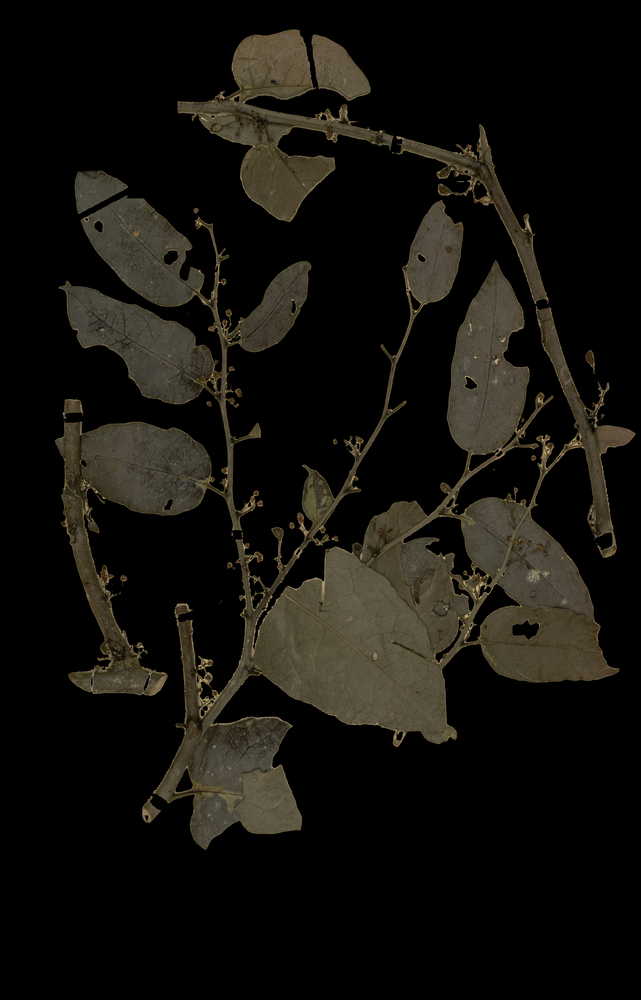

In [22]:
import os
import matplotlib.pyplot as plt
import cv2
from IPython.display import display
from PIL import Image

def show_images_from_folder(folder_path):
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    for image_file in image_files:
        image_path = os.path.join(folder_path, image_file)
        img = Image.open(image_path)
        display(img)

# Set the path to your output folder
output_folder = "./output_folder"
show_images_from_folder(output_folder)
